# Sentinel-1 Flooding
This notebook uses Sentinel-1 data to detect water extent and flooding. Since radar can penetrate clouds, it is possible to get consistent time series views of a region at 6-day or 12-day revisits based on the use of one or two Sentinel-1 missions. If the region of interest falls within a scene overlap, it may be possible to get even more frequent visits. This notebook includes several different data products including histograms to find a good threshold for water detection, a single date VH-band threshold product to identify water extent, and a multi-date change product to identify new flooding.
<br><br>
The core data has been processed by Google Earth Engine using GRD scenes to create C-band backscatter (VV and VH bands) at 10-meters spatial resolution. The data is consistently available from early 2017 for the globe. It is important to note that this data does NOT include radiometric terrain correction (RTC) so there are issues using this data in mountaineous areas. In addition, users are recommended to only compare scenes from the same pass direction (ascending or descending) and orbit path to avoid viewing geometry issues. 
<br><br>
For more information about how to interpret radar data, see the following document:<br> "A Layman's Interpretation Guide to L-Band and C-Band Synthetic Aperture Radar Data" found <a href="https://ceos.org/document_management/SEO/DataCube/Laymans_SAR_Interpretation_Guide_2.0.pdf" target="_blank"><b>HERE</b></a>.

## Instructions for Execution
It is suggested that users first execute the notebook "as is" to successfully complete the Google authorizations and view sample results. Then, users should look for eight different "MODIFY HERE" labels at the top of code blocks to identify code that can be modified. These include:<br>
<br>#1 - Select spatial region and time extent
<br>#2 - Select data filtering parameters
<br>#3 - Select block average filter size
<br>#4 - Select scene for histogram and RGB 
<br>#5 - Select parameters for single date output products
<br>#6 - Select two dates for flooding product
<br>#7 - Select parameters for multi-date output products
<br>#8 - Select file output parameters
<br><br>
Once the full notebook has been run, users can run individual code blocks using "Shift-Return" or run segments of the code using the Runtime menu. Users do not have to go thru the Google authorization steps for additional execution cycles. 

In [ ]:
!wget -nc https://raw.githubusercontent.com/ceos-seo/odc-colab/master/odc_colab.py
from odc_colab import odc_colab_init
odc_colab_init(install_odc_gee=True)

In [ ]:
from odc_colab import populate_db
populate_db()

## Load the Data Cube Configuration and Import Utilities

In [ ]:
# Ignore warnings 
import warnings
warnings.simplefilter('ignore')

# Load Data Cube Configuration
from odc_gee.earthengine import Datacube
dc = Datacube()

# Import Utilities
from utils.data_cube_utilities.dc_display_map import display_map
from utils.data_cube_utilities.dc_rgb import rgb
from utils.data_cube_utilities.raster_filter import stats_filter_2d
from utils.data_cube_utilities.import_export import export_xarray_to_geotiff
import folium
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
# Select data platform and product
# NOTE: Data from both Sentinel-1A and Sentinel-1B missions are included
platform = 'Sentinel-1A'
product = 's1_google'

## Define the Extents of the Analysis and View
Select the center of an analysis region (lat_long) below. The size of the region (in degrees) that surrounds this center point is defined using the "box_size_deg" parameter. Users can select one of the example regions or add a new region. Use the map output to zoom in-or-out to find other regions. Click on the map to find a Lat-Lon position. After selecting an analysis region, you can also select a time window by defining the start date and end date for the "time_extents" parameter. Consistent Sentinel-1 time series data is available from Jan-2017. To avoid issues with exceeding memory limits, users should start with small regions (<0.20 degrees) and small time windows (a few months) before expanding to larger analyses.

In [6]:
#1 MODIFY HERE

# Remove the comment (#) tags to select an example case from the code blocks below.
# Examples #1 and #2 include data filters to ensure consistent viewing angles (orbit numbers)
# Example #3 is for users to define their own general case study

In [7]:
# Example #1 - Campur, Guatemala
# Rains started on Nov 3, 2020 (Tropical Storm Eta)
# Rains ended on Nov 17, 2020 (Tropical Storm Iota)
# Time Extents = 2020-10-01 to 2021-03-01 (5 months)

# lat_long = (15.6339, -90.0471)
# box_size_deg = 0.02
# time_extents = ('2020-10-01', '2021-03-01')

In [8]:
%%html 
<img src="https://raw.githubusercontent.com/gamedaygeorge/odc-colab/master/Images/Flood_Example_Campur.jpeg" width="40%"></img>

In [9]:
# Example #2 - Macuspana, Tabasco, Mexico
# Flooded on 04-Oct from Tropical Storm Gamma
# Flooded on 09-Nov from Tropical Storm Eta
# Time Extents = 2020-09-01, 2020-12-31 (3 months)

lat_long = (17.713, -92.595)
box_size_deg = 0.20
time_extents = ('2020-09-01', '2020-12-31')

In [10]:
%%html 
<img src="https://raw.githubusercontent.com/gamedaygeorge/odc-colab/master/Images/Flood_Example_Tabasco.jpeg" width="40%"></img>

In [11]:
# Example #3 - General Case Study

# Define spatial extent in latitude and longitude
# lat_lon > center of window
# box_size_deg > width and height of the window in degrees 

# lat_long = (LAT, LON)
# box_size_deg = SIZE IN DEGREES

# Define time extent (YYYY-MM-DD)

# time_extents = ('START', 'END')

In [12]:
# Calculate the latitude and longitude bounds of the analysis box
latitude = (lat_long[0]-box_size_deg/2, lat_long[0]+box_size_deg/2)
longitude = (lat_long[1]-box_size_deg/2, lat_long[1]+box_size_deg/2)

In [13]:
#2 MODIFY HERE

# Define the parameter list to filter the data
# Remove the comment (#) tags below to select ONE of the parameters lines

# Example #1 - Campur, Guatemala
# Data Filter > Orbit=26

# parameters = dict(product=product, platform=platform, measurements=['vv','vh'],time=time_extents, lat=latitude, lon=longitude, group_by='time',query={'filter':'relativeOrbitNumber_start=26'})

# Example #2 - Macuspana, Tabasco, Mexico
# Data Filter > Orbit=99

parameters = dict(product=product, platform=platform, measurements=['vv','vh'],time=time_extents, lat=latitude, lon=longitude, group_by='time',query={'filter':'relativeOrbitNumber_start=99'})

# Example #3 - General Case Study

# ALL DATA
# This parameter list will load all data (both pass directions, both missions, all orbits)
# Use the output to review available data before adding further filters (below)

# parameters = dict(product=product, platform=platform, measurements=['vv','vh'],time=time_extents, lat=latitude, lon=longitude, group_by='time')

# FILTERED DATA
# group_by = time (all images separated) or solar_day (grouped daily)
# orbitProperties_pass = ASCENDING or DESCENDING
# platform_number = A or B
# relativeOrbitNumber_start = (any specific orbit number)

# parameters = dict(product=product, platform=platform, measurements=['vv','vh'],time=time_extents, lat=latitude, lon=longitude, group_by='time',query={'filter':'orbitProperties_pass="ASCENDING" AND platform_number="A" AND relativeOrbitNumber_start=136'})

In [14]:
f = folium.Figure(width=800, height=800)
m = display_map(latitude,longitude)
f.add_child(m)

## Load the data and apply filtering

In [15]:
sar_dataset = dc.load(**parameters)

In [16]:
#@title Filter Metadata
# Filter Metadata

from operator import itemgetter

def get_metadata(group):
    metadata = (set(), set(), set(), set())
    for ds in group:
        metadata[0].add(np.datetime64(ds.metadata_doc.get('properties').get('dtr:start_datetime'), 'D'))
        metadata[1].add(ds.metadata_doc.get('properties').get('gee:properties').get('orbitProperties_pass'))
        metadata[2].add(ds.metadata_doc.get('properties').get('gee:properties').get('platform_number'))
        metadata[3].add(ds.metadata_doc.get('properties').get('gee:properties').get('relativeOrbitNumber_start'))
    return tuple(map(lambda x: ', '.join([str(i) for i in x]), metadata))

parameters.update(group_by='time' if not parameters.get('group_by') else parameters['group_by'])
sar_metadata = sorted([get_metadata(groups)
                       for groups in dc.group_datasets(dc.find_datasets(**parameters),
                                                       parameters.get('group_by')).values],
                      key=itemgetter(0))

## Data Summary
The table below summarizes the available Sentinel-1 data. You will find different acquisition dates, pass directions (ascending or descending), missions (A=Sentinel-1A, B=Sentinel-1B) and orbit path numbers. Finding flooding requires comparisons of images from similar viewing angles. So, it is important to only compare acquisitions with the same orbit path number. You will find that the same orbit number can come from two missions (6-day separation) or one mission (12-day separation) but the pass direction (ascending or descending) will be the same. 

In [17]:
# Show acquisition indices and dates
pd.set_option('display.max_rows', 100)
pd.DataFrame(sar_metadata, columns=['Acquisition Date', 'Pass Direction', 'Mission', 'Orbit Number'])

,Acquisition Date,Pass Direction,Mission,Orbit Number
0,2020-09-04,DESCENDING,B,99
1,2020-09-10,DESCENDING,A,99
2,2020-09-16,DESCENDING,B,99
3,2020-09-22,DESCENDING,A,99
4,2020-09-28,DESCENDING,B,99
5,2020-10-04,DESCENDING,A,99
6,2020-10-10,DESCENDING,B,99
7,2020-10-16,DESCENDING,A,99
8,2020-10-22,DESCENDING,B,99
9,2020-11-03,DESCENDING,B,99


### Speckle Filtering using a Block Average Filter
Radar data is often "grainy" in appearance due to speckle (statistical noise) and differences between water and land are not consistent. To improve the data, it is quite common to use speckle filtering. Below is an algorithm that uses a common "block averaging" filter to average the pixels surrounding any given pixel. Users can select an odd number filter window size (e.g. 3,5,7, etc.) to filter both the VV and VH data. A filter window size of 3 will average a 3x3 region around every pixel. Similarly, a filter window size of 5 will average a 5x5 region around a every pixel. 

In [18]:
# Setup dB to power conversion functions so that the block average speckle filter works on power values

def to_pwr(x):
    return 10**(x/10)
def to_db(x):
    return 10*np.log10(x)

In [19]:
#3 MODIFY HERE

# Users can select the block average filter size to define the level of speckle filtering. The baseline is 5.
# The filter size must be an odd number, such as 3,5,7, etc. 

block_size = 5

# Set any null values to 0 before applying the filter to prevent issues
sar_dataset_filled = sar_dataset.where(~sar_dataset.isnull(), 0)

# Create a new entry in dataset corresponding to filtered VV and VH data
sar_dataset["block_avg_filter_vv"] = sar_dataset_filled.vv.pipe(to_pwr).groupby("time")\
                                 .apply(stats_filter_2d, statistic='mean', filter_size=block_size)\
                                 .pipe(to_db)
sar_dataset["block_avg_filter_vh"] = sar_dataset_filled.vh.pipe(to_pwr).groupby("time")\
                                 .apply(stats_filter_2d, statistic='mean', filter_size=block_size)\
                                 .pipe(to_db)

## View Histogram Plots
Histogram plots are good for viewing the statistical backscatter distribution of the VV and VH data. In most cases it is easy to identify the difference between land pixels (higher values) and water pixels (lower values). VV-polarised backscatter may however sometimes be affected by wind and rain effects (which may cause a backscatter increase) which is why the VH polarisation channel is recommended for detection of water. The VH histogram in the example below will typically show land at a peak around -15 dB and water (dark) at a peak around -27 dB. A reasonable threshold for water detection may be estimated from this histogram. For example, the baseline code selects a VH threshold of -21 dB for the water and land separation which yields reasonable results in most regions. Users should test this threshold to determine the best value for a particular region or water body.

In [20]:
#4 MODIFY HERE

# Choose a single time slice by its index (listed above)
acq_ind_to_show = 0

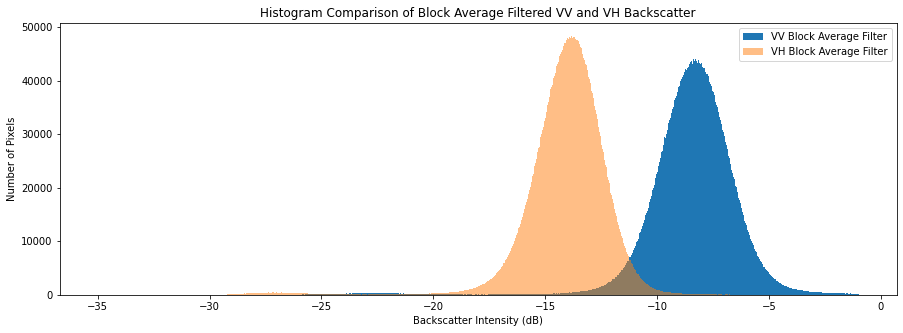

In [21]:
fig = plt.figure(figsize=(15, 5))
sar_dataset.isel(time=acq_ind_to_show).block_avg_filter_vv.plot.hist(bins=1000,range=(-35,-1),label="VV Block Average Filter")
sar_dataset.isel(time=acq_ind_to_show).block_avg_filter_vh.plot.hist(bins=1000,range=(-35,-1),label="VH Block Average Filter", alpha=0.5)
plt.legend()
plt.xlabel("Backscatter Intensity (dB)")
plt.ylabel("Number of Pixels")
plt.title("Histogram Comparison of Block Average Filtered VV and VH Backscatter")
plt.show()

## Scale the backscatter amplitude for better image outputs
Backscatter amplitude for each band can be scaled to an 8-bit range of 0-255 to improve visual output and maximize contrast in image products. This process is explained here. Sigma-nought backscatter (in dB units) is converted to linear amplitude (digital number) units using the conversion: DN (amplitude) = 10^(dB/20). Histograms are then used to view the range of dB values for the VV and VH bands. The range of expected values (across diverse land types) is then scaled to an 8-bit range using the formula: Scale = 256 / (range). Finally, an "offset" value is applied to allow the full range of values to be distributed across the 8-bit range. The final conversion equation is: DN (amplitude, 8-bit) = ( DN(amplitude) - offset ) * scale. 

In [22]:
# This backscatter scaling is optimized for block-filtered data
# VV band range is 0dB to -16dB which is DN=1.00 to DN=0.158
# VH band range is -5dB to -27dB which is DN=0.562 to DN=0.045
# VV/VH range is 0.0 to 1.0. This data is scaled by 20 for improved color contrast

vv_convert = (10**(sar_dataset.block_avg_filter_vv/20)-0.158)*303
vh_convert = (10**(sar_dataset.block_avg_filter_vh/20)-0.045)*493
sar_dataset['vv_amp'] = vv_convert
sar_dataset['vh_amp'] = vh_convert
sar_dataset['vvvh_amp'] = (vv_convert / vh_convert) * 20

RGB False-Color Image of Backscatter Intensity

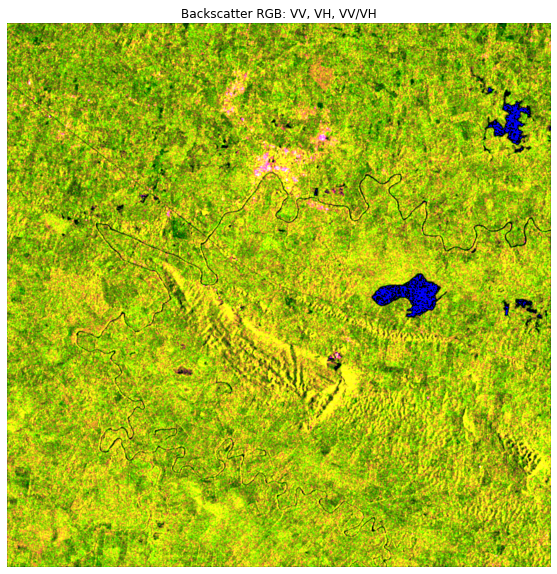

In [23]:
# RGB Plot of Backscatter Intensity (RGB= VV, VH, VV/VH)
# High backscatter (both bands) due to vegetation and foliage will appear as YELLOW (mix of red and green)
# Urban areas are BRIGHT YELLOW or MAGENTA in color (due to high overall scattering at both VV and VH, 
# or, in the case of the magenta color, higher VV compared to VH)
# Sparsely vegetated and bare soil areas are BLUE (due to low overall scattering and higher VV compared to VH)
# Water (without wind or rain effects) is BLACK (very low backscatter in both bands with similar VV and VH)

rgb(sar_dataset.isel(time=acq_ind_to_show),bands=['vv_amp','vh_amp','vvvh_amp'], width=10)
plt.title('Backscatter RGB: VV, VH, VV/VH')
plt.axis('off')
plt.show()

## Single Date Single-Band Threshold Water Extent
The code below allows users to select a single date (use the index table above), a single band (e.g. VV or VH), and a water detection threshold value for the selected band. Review the histogram plots above to be sure the selected band and threshold are reasonable. It is common to use the VH band for water detection. The final product shows the water in BLUE color against a gray-scale VH-band background image. 

In [24]:
#5 MODIFY HERE

# Select a single date, band, and threshold for water detection

single_date = 0
single_variable = 'block_avg_filter_vh'
water_threshold = -21.0

In [25]:
color_blue = np.array([0,0,255]) # Water (BLUE)
scene = sar_dataset.isel(time=single_date)
water = scene[single_variable].values < water_threshold

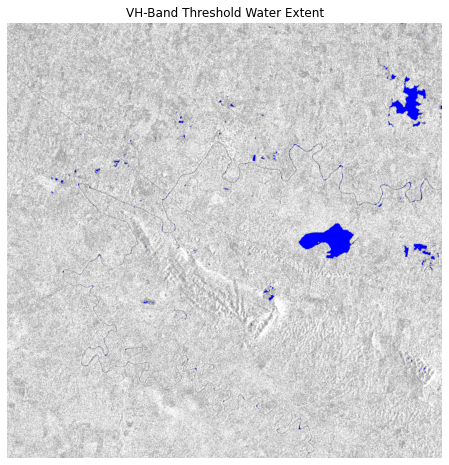

In [26]:
rgb(scene, bands=['vh', 'vh', 'vh'], paint_on_mask=[(water, color_blue)], width=8, min_inten=0.6)
plt.title('VH-Band Threshold Water Extent')
plt.axis('off')
plt.show()

## Multi-Date Single-Band Threshold Flooding
The code below selects two dates, a variable (VV or VH) and a change threshold. The final product performs a comparison of the two dates and calculates the change in backscatter between those dates. Pixels with significant reduction in backscatter (e.g., loss of 7 dB) are likely changes from land to water due to flooding. Finding flooding requires comparisons of images from similar viewing angles. So, it is important to only compare acquisitions with the same orbit number. You will find that the same orbit number can come from two missions (6-day separation) or one mission (12-day separation) but the pass direction (ascending or descending) will be the same. 

In [27]:
#6 MODIFY HERE

# Select TWO acquisitions to calculate a change product
# Choose from the indices in the table above
# first_acq_ind = First time slice acquisition
# second_acq_ind = Second time slice acquisition

# Example #1 - Campur, Guatemala
# Compare Acquisitions: 0=(05-Oct) to 11=(10-Dec)
# first_acq_ind = 0
# second_acq_ind = 11

# Example #2 - Macuspana, Tabasco, Mexico
# Compare Acquisitions: 0=(04-Sep) to 10=(09-Nov)
first_acq_ind = 0
second_acq_ind = 10

# Example #3 - GENERAL
# first_acq_ind = TBD
# second_acq_ind = TBD

In [28]:
#7 MODIFY HERE

# Select the variable to plot and the change threshold to identify flooding

threshold_variable = 'block_avg_filter_vh'

# The code will calculate the difference of the two images (Second-First)
# Define a threshold range to compare the difference of the two acquisitions
# GREY = Pixels NOT in the threshold range 
# RED = Pixels LESS than the low end of the threshold range

change_threshold = -7

In [29]:
# Set the overlay colors
# Calculate the difference in backscatter between the two times
# Find the pixels above or below the threshold range (these are significant changes)

color_loss = np.array([255,0,0]) # backscatter decrease (RED)
color_black = np.array([0,0,0]) # low backscatter change, water (BLACK)
color_blue = np.array([0,0,255]) # Water (BLUE)

first_acq = sar_dataset.isel(time=first_acq_ind)
second_acq = sar_dataset.isel(time=second_acq_ind)
change_product = second_acq[threshold_variable] - first_acq[threshold_variable]
below_threshold = change_product.values < change_threshold

In [30]:
# Set the water threshold value based on data in the histograms for the selected band
# This will "mask" the water pixels in the first acquisition

water = first_acq[threshold_variable].values < water_threshold

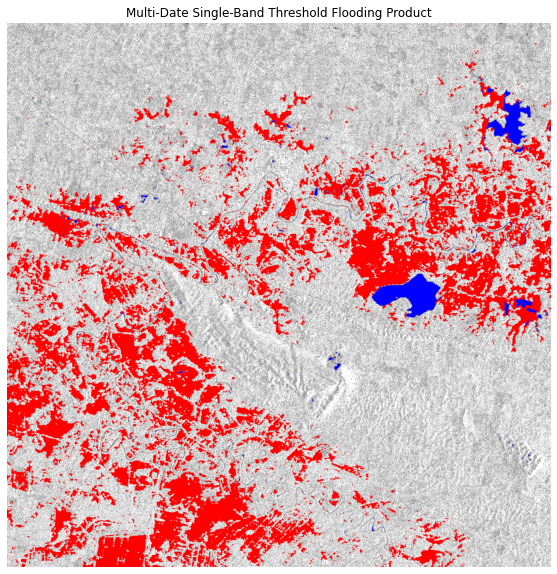

In [31]:
# Create a custom threshold plot to identify flooding
# The background image VH backscatter (grey-scale)
# RED areas have decreased backscatter indicative of new flooding
# BLUE areas are water in the first acquisition 

rgb(first_acq, bands=['vh', 'vh', 'vh'], paint_on_mask=[(below_threshold, color_loss),(water, color_blue)], width=10, min_inten=0.6)
plt.title('Multi-Date Single-Band Threshold Flooding Product')
plt.axis('off')
plt.show()

In [32]:
# Generate a GEOTIFF of the prior image
# 0=no water, 1=baseline water, 2=flooded
# The code to save this image on Google Drive is at the end of the notebook

filename = 'flooding_image'

export_xarray_to_geotiff(first_acq.vh.where(~water, 1).where(water, 0)\
                         + first_acq.vh.where(~below_threshold, 2).where(below_threshold, 0),
                         f'{filename}.tif')

In [33]:
#@title Create a Folium Map
# Plot the results on a folium map
# Click the menu on the top-left of the image to select different background layers

loss_layer = np.dstack([below_threshold.astype(np.int8)*c \
                        for c in color_loss]+[below_threshold.astype(np.int8)])
water_layer = np.dstack([water.astype(np.int8)*c \
                         for c in color_blue]+[water.astype(np.int8)])

f = folium.Figure(width=800, height=800)
_map = display_map(latitude, longitude)
_map.add_child(folium.TileLayer(tiles='OpenStreetMap', name='OpenStreetMap'))
_map.add_child(folium.TileLayer(tiles='https://{s}.tile.opentopomap.org/{z}/{x}/{y}.png',
                                max_zoom=17,
                                attr='Map data: &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, <a href="http://viewfinderpanoramas.org">SRTM</a> | Map style: &copy; <a href="https://opentopomap.org">OpenTopoMap</a> (<a href="https://creativecommons.org/licenses/by-sa/3.0/">CC-BY-SA</a>)',
                                name='OpenTopoMap'))
_map.add_child(folium.raster_layers.ImageOverlay(loss_layer, [(latitude[0], longitude[0]),
                                                              (latitude[1], longitude[1])], name='Flooding'))
_map.add_child(folium.raster_layers.ImageOverlay(water_layer, [(latitude[0], longitude[0]),
                                                              (latitude[1], longitude[1])], name='Water'))
_map.add_child(folium.LayerControl(position='topleft'))
f.add_child(_map)

## Plot the Time Series Water Extent

In [34]:
water_time = ((sar_dataset[single_variable] < water_threshold))

In [35]:
out = []
for obj in water_time:
    total = obj.values.sum()*100/1000/1000
    day = [total]
    out.append(day)

In [36]:
water_pixels = out
scene = sar_dataset.time.dt.date.values

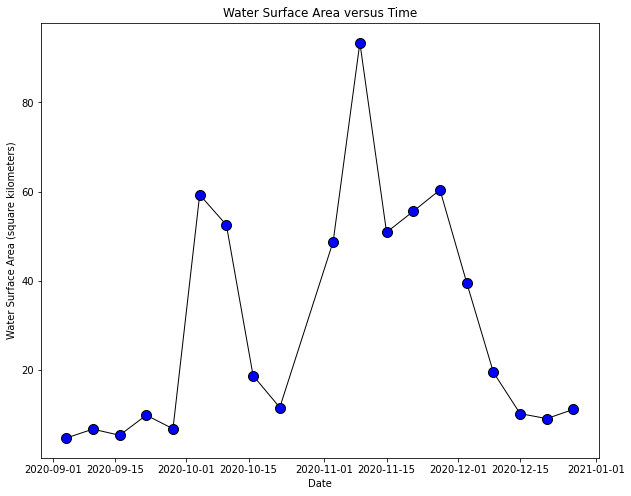

In [37]:
plt.figure(figsize=(10,8))
plt.plot(scene, water_pixels, c='black', marker='o', mfc='blue', markersize=10, linewidth=1)
plt.title('Water Surface Area versus Time')
plt.xlabel('Date')
plt.ylabel('Water Surface Area (square kilometers)')
plt.show()

## Make a GIF of the Time Series Water Extent

In [38]:
import imageio
import os

In [39]:
# Use a start/end date for entire time series
start_date = 0
end_date = scene.size-1 if scene.size >= 1 else 0

In [40]:
# The code below will calculate the difference between each image in the time series and the first image
# Define a threshold range to compare the difference of the two acquisitions
# GREY = Pixels NOT below the change threshold (not baseline water or flooding)
# RED = Pixels BELOW the change threshold (flooding extent)
# BLUE = Water in the first image (baseline water extent)

change_threshold = -7
color_red = np.array([255,0,0]) # Flooding (RED)
color_blue = np.array([0,0,255]) # Baseline Water (BLUE)

In [41]:
#@title Create Time Series Animation
#@markdown This is more information
# Create Time Series Animation
filenames = []
for i in range(start_date, end_date+1):
    
    first_acq = sar_dataset.isel(time=0)
    baseline_water = first_acq[single_variable].values < water_threshold
    scene = sar_dataset.isel(time=i)
    change_product = scene[single_variable] - first_acq[single_variable]
    flooding = change_product.values < change_threshold
    
    rgb(scene, bands=['vh','vh','vh'],
        paint_on_mask=[(flooding, color_red),(baseline_water, color_blue)], width=10, min_inten=0.4)
    
    date_str = np.datetime_as_string(scene.time.values.astype('datetime64[D]'), unit='D')
    plt.title('VH-Band Threshold Water Extent Time Series\n' + date_str)
    plt.axis('off')
    
    # create file name and append it to a list
    filename = f'{i}.png'
    filenames.append(filename)
    
    # save frame
    plt.savefig(filename)
    plt.close()

# Build gif
with imageio.get_writer('flooding.gif', mode='I', fps=1) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image) 

# Remove files
for filename in set(filenames):
    os.remove(filename)

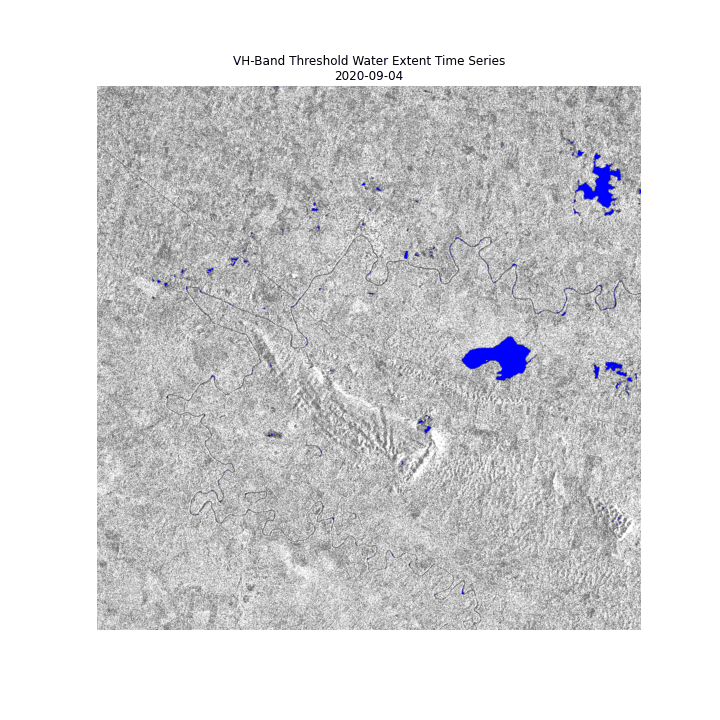

In [42]:
from IPython.display import Image
Image(open('flooding.gif','rb').read())

### Save Output Products
The code below requires an additional Google authentication step to mount a user's Google Drive. Once this authorization is complete, the second code block will copy the output files to the drive.

Another method to save any of the output products is to simply "right-click" any output product and select "Save Image As" to save a copy to the user's local computer.

In [43]:
#8 MODIFY HERE

# Mount Google Drive
# Remove the comments from the two lines below to connect to Google Drive

# from google.colab import drive        
# drive.mount('/content/drive')

# Save the GEOTIFF and GIF animation to the output folder
# Remove the comments below to output different examples

# Example #1 - Campur, Guatemala
# !cp flooding.gif drive/MyDrive/campur.gif
# !cp flooding_image.tif drive/MyDrive/campur.tif

# Example #2 - Macuspana, Tabasco, Mexico
# !cp flooding.gif drive/MyDrive/macuspana.gif
# !cp flooding_image.tif drive/MyDrive/macuspana.tif